<a href="https://colab.research.google.com/github/eryko2002/LorenzSystem/blob/main/Sprawozdanie_Lab3_PMUT.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [48]:
import time 

import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

In [2]:
from google.colab import drive
drive.mount("/content/drive")
data_dir = "/content/sample_data/"


Mounted at /content/drive


In [51]:
# imshow = cv_imshow   ### wyświetlanie z użyciem cv2
# imshow = plt_imshow  ### wyświetlanie z użyciem matplotlib

#def imshow(img, img_title="image"):  ### 'opakowanie' na cv_imshow(), żeby 'zablokować' program; przydatne przy interaktywnym wykonywaniu, np. dla Jupyter Notebook
#   cv_imshow(img, img_title) 
#   cv2.waitKey(0)
#   cv2.destroyAllWindows()
def imshow(img, img_title="image"):  ### 'opakowanie' na cv2_imshow(), żeby 'uzgodnić' parametry wywołania
    cv2_imshow(img) 

def printi(img, img_title="image"):
    print(f"{img_title}, wymiary: {img.shape}, typ danych: {img.dtype}, wartości: {img.min()} - {img.max()}")

In [52]:
def calcPSNR(img1, img2):
  imax = 255.**2  ### zakładana wartość pikseli z przedziału [0, 255]
  ##### w różnicy obrazów istotne są wartości ujemne, dlatego img1 konwertowany do typu np.float64 (liczby rzeczywiste) aby nie ograniczać wyniku do przedziału [0, 255]
  mse = ((img1.astype(np.float64)-img2)**2).sum()/img1.size  ### img1.size - liczba elementów w img1, ==img1.shape[0]*img1.shape[1] dla obrazów mono, ==img1.shape[0]*img1.shape[1]*img1.shape[2] dla obrazów barwnych
  return 10.0*np.log10(imax/mse)

In [84]:
def gaussian_Blur(image_noise,n):
  gblur_img= cv2.GaussianBlur(image_noise, (n, n), 0)
  #printi(gblur_img, "gblur_img")
  imshow(gblur_img, "gblur_img")
  return gblur_img

def median_Blur(image_noise,n):
  median_img = cv2.medianBlur(image_noise, n) 
  imshow(median_img, "gblur_img")
  return median_img

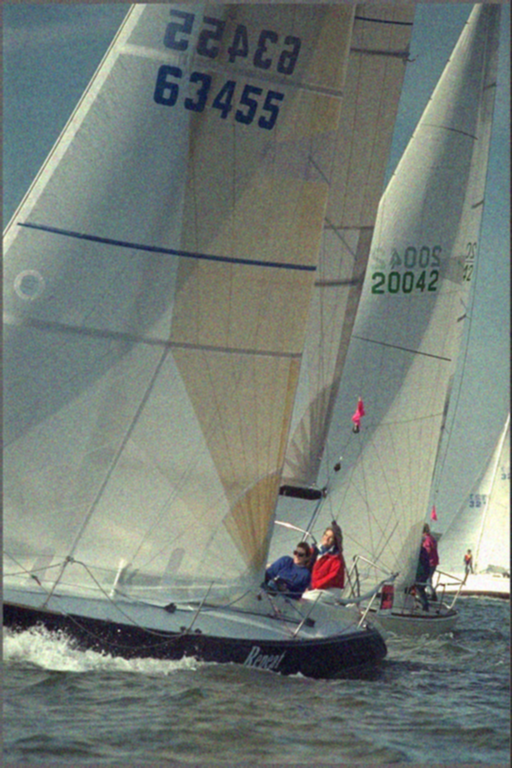

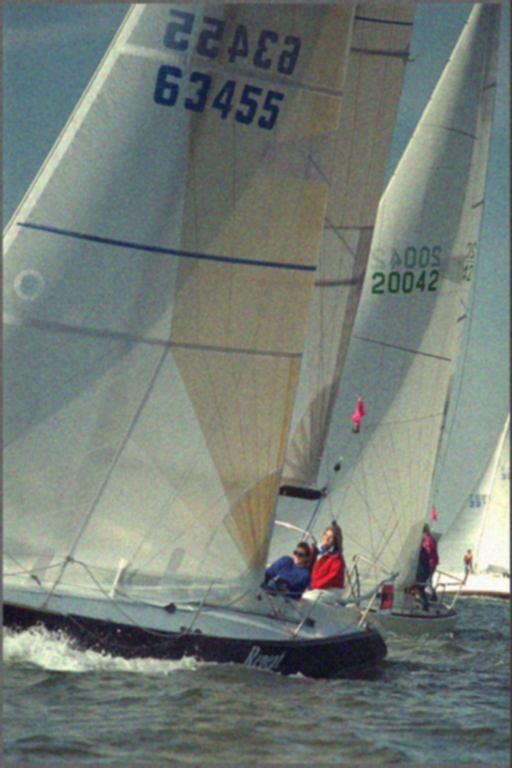

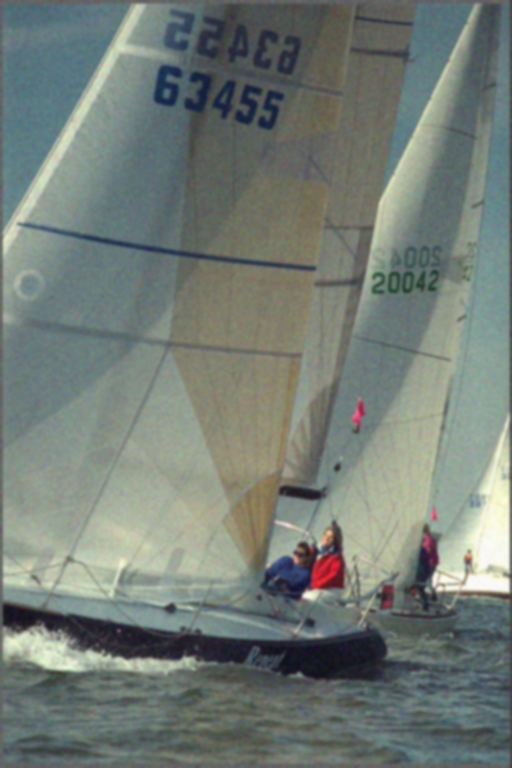

Obliczanie współczynnika PSNR dla obrazu zaszumionego szumem gaussowskim - filtr wygładzający
PSNR dla rozmiaru maski 3x3 : 29.991974298937695
PSNR dla rozmiaru maski 5x5 : 29.262843265617295
PSNR dla rozmiaru maski 7x7 : 28.099356278165754


In [85]:
#Zadanie 1 a
#wczytuję obraz oryginalny
org_img = cv2.imread(data_dir+"sailboat_col.png", cv2.IMREAD_UNCHANGED)

gblur_img3 = gaussian_Blur(image_noise,3)
gblur_img5 = gaussian_Blur(image_noise,5)
gblur_img7 = gaussian_Blur(image_noise,7)

psnr3 = calcPSNR(org_img,gblur_img3)
psnr5 = calcPSNR(org_img,gblur_img5)
psnr7 = calcPSNR(org_img,gblur_img7)
print("Obliczanie współczynnika PSNR dla obrazu zaszumionego szumem gaussowskim - filtr wygładzający")
print("PSNR dla rozmiaru maski 3x3 : {}".format(psnr3))
print("PSNR dla rozmiaru maski 5x5 : {}".format(psnr5))
print("PSNR dla rozmiaru maski 7x7 : {}".format(psnr7))

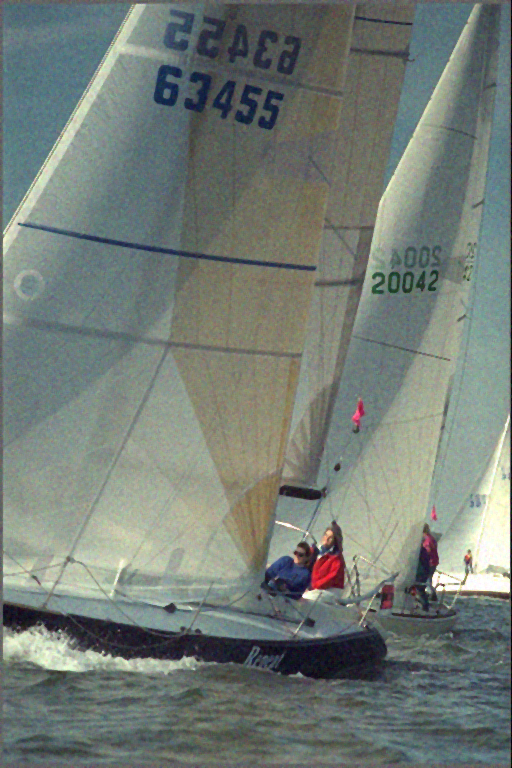

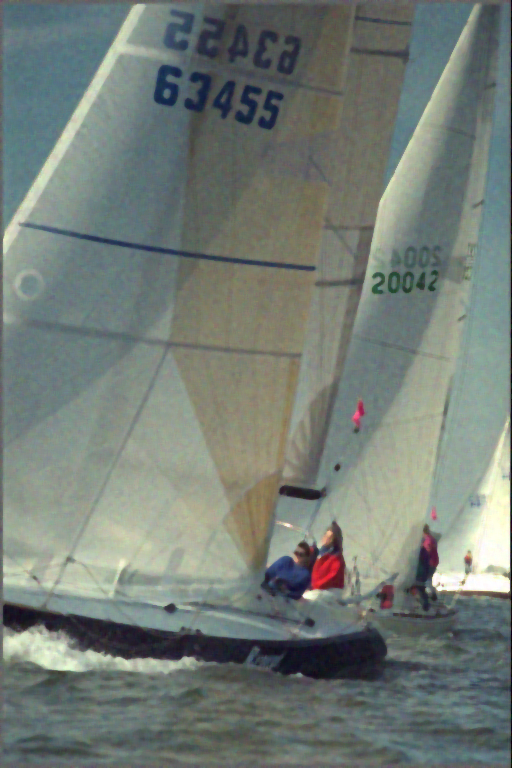

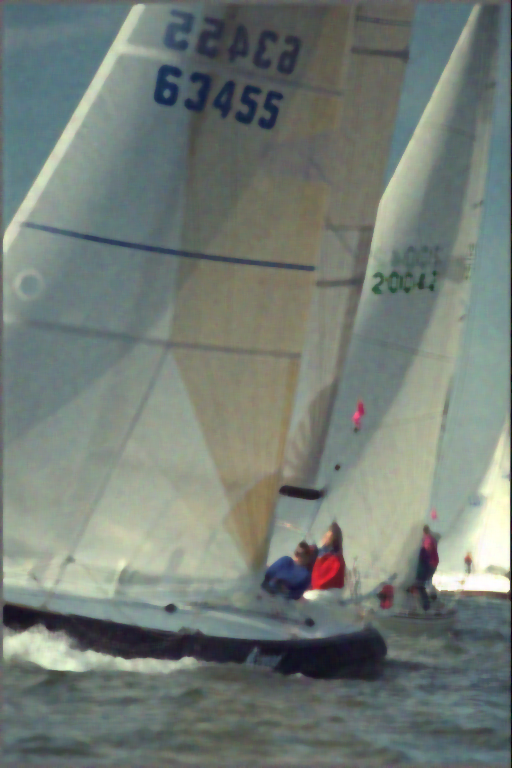

Obliczanie współczynnika PSNR dla obrazu zaszumionego szumem gaussowskim - filtr medianowy
PSNR dla rozmiaru maski 3x3 : 29.322042495423997
PSNR dla rozmiaru maski 5x5 : 27.98925241378103
PSNR dla rozmiaru maski 7x7 : 27.055817378199244


In [86]:
#Zadanie 1 b
median_img3 = median_Blur(image_noise,3)
median_img5 = median_Blur(image_noise,5)
median_img7 = median_Blur(image_noise,7)

psnr_median3 = calcPSNR(org_img,median_img3)
psnr_median5 = calcPSNR(org_img,median_img5)
psnr_median7 = calcPSNR(org_img,median_img7)
print("Obliczanie współczynnika PSNR dla obrazu zaszumionego szumem gaussowskim - filtr medianowy")
print("PSNR dla rozmiaru maski 3x3 : {}".format(psnr_median3))
print("PSNR dla rozmiaru maski 5x5 : {}".format(psnr_median5))
print("PSNR dla rozmiaru maski 7x7 : {}".format(psnr_median7))


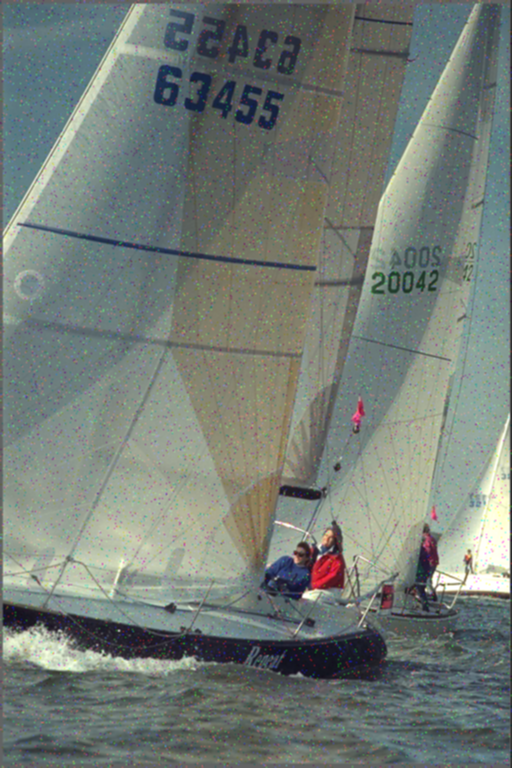

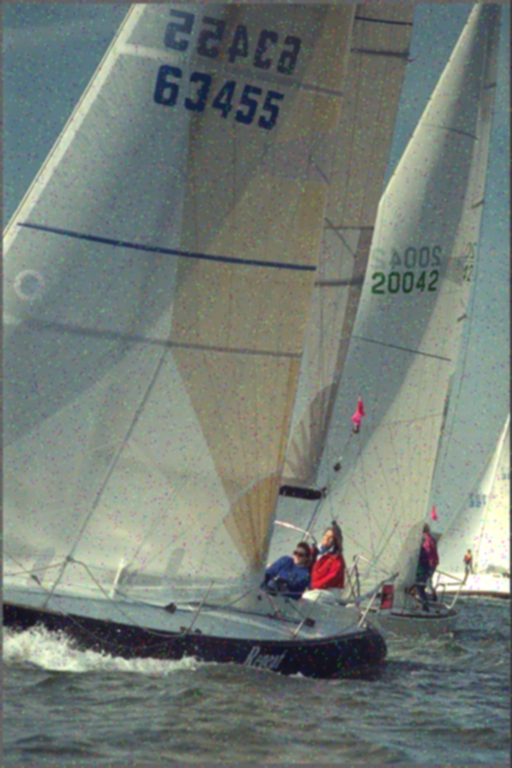

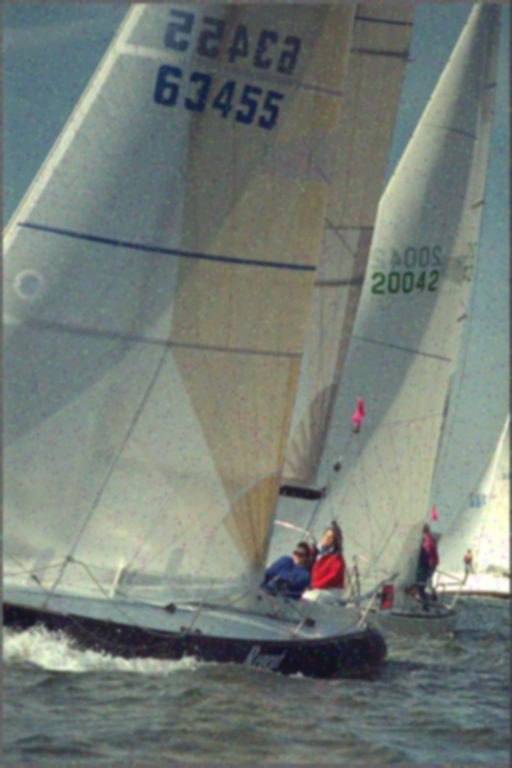

Obliczanie współczynnika PSNR dla obrazu zaszumionego szumem impulsowym - filtr wygładzający
PSNR dla rozmiaru maski 3x3 : 23.6614759553336
PSNR dla rozmiaru maski 5x5 : 22.513924872397638
PSNR dla rozmiaru maski 7x7 : 21.806596832972858


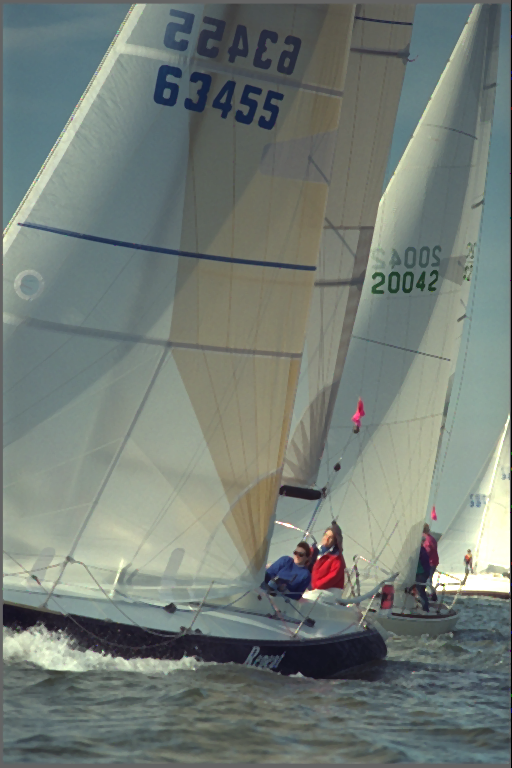

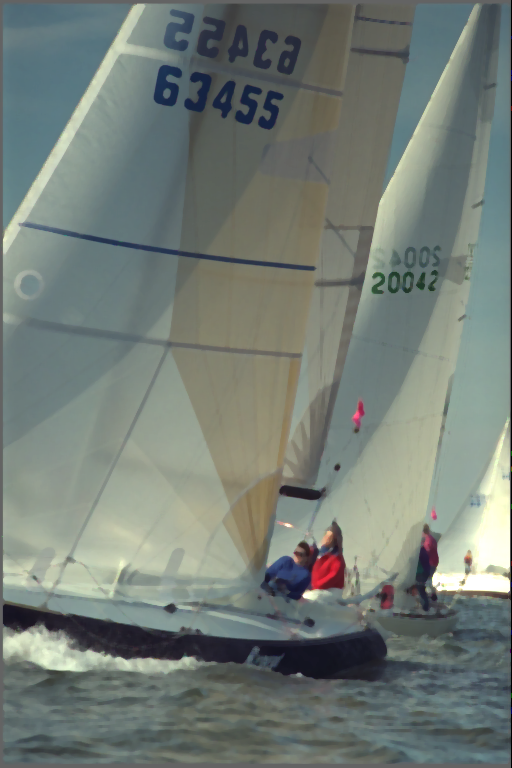

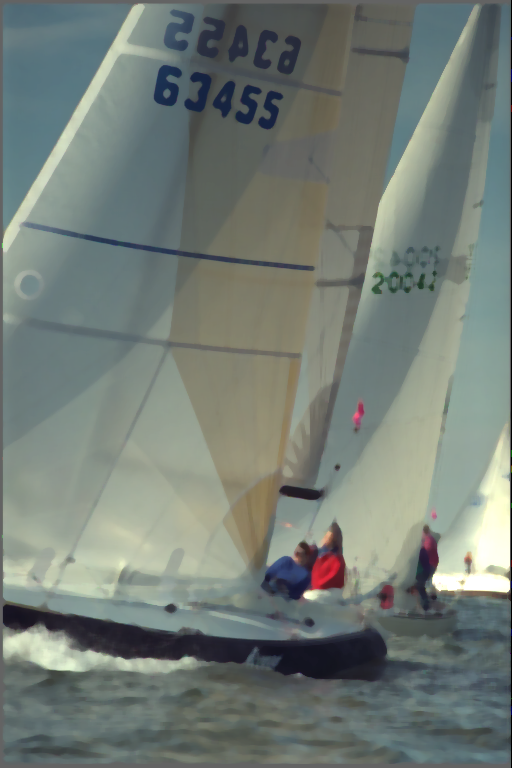


Obliczanie współczynnika PSNR dla obrazu zaszumionego szumem gaussowskim - filtr medianowy
PSNR dla rozmiaru maski 3x3 : 29.322042495423997
PSNR dla rozmiaru maski 5x5 : 27.98925241378103
PSNR dla rozmiaru maski 7x7 : 27.055817378199244


In [87]:
#Zadanie 1 c
#wczytuję obraz zaszumiony szumem impulsowym
image_inoise = cv2.imread(data_dir+"sailboat_col_inoise.png", cv2.IMREAD_UNCHANGED)

#powtórzenie operacji z filtem wygładzającym
gblur_img_inoise_3 = gaussian_Blur(image_inoise,3)
gblur_img_inoise_5 = gaussian_Blur(image_inoise,5)
gblur_img_inoise_7 = gaussian_Blur(image_inoise,7)

psnr_gauss_inoise3 = calcPSNR(image_inoise,gblur_img_inoise_3)
psnr_gauss_inoise5 = calcPSNR(image_inoise,gblur_img_inoise_5)
psnr_gauss_inoise7 = calcPSNR(image_inoise,gblur_img_inoise_7)
print("Obliczanie współczynnika PSNR dla obrazu zaszumionego szumem impulsowym - filtr wygładzający")
print("PSNR dla rozmiaru maski 3x3 : {}".format(psnr_gauss_inoise3))
print("PSNR dla rozmiaru maski 5x5 : {}".format(psnr_gauss_inoise5))
print("PSNR dla rozmiaru maski 7x7 : {}".format(psnr_gauss_inoise7))


#powtórzenie operacji z filtem medianowym
median_img_inoise3 = median_Blur(image_inoise,3)
median_img_inoise5 = median_Blur(image_inoise,5)
median_img_inoise7 = median_Blur(image_inoise,7)

psnr_median_inoise3 = calcPSNR(org_img,median_img_inoise3)
psnr_median_inoise5 = calcPSNR(org_img,median_img_inoise5)
psnr_median_inoise7 = calcPSNR(org_img,median_img_inoise7)
print("\nObliczanie współczynnika PSNR dla obrazu zaszumionego szumem gaussowskim - filtr medianowy")
print("PSNR dla rozmiaru maski 3x3 : {}".format(psnr_median3))
print("PSNR dla rozmiaru maski 5x5 : {}".format(psnr_median5))
print("PSNR dla rozmiaru maski 7x7 : {}".format(psnr_median7))

In [88]:
from tabulate import tabulate
table = [["obraz_gaussowski_n=3",psnr3,psnr_median3],
         ["obraz_gaussowski_n=5",psnr5,psnr_median5],
         ["obraz_gaussowski_n=7",psnr7,psnr_median7],
         [],
         ["obraz_szum_impulsowy_n=3",psnr_gauss_inoise3,psnr_median_inoise3],
         ["obraz_szum_impulsowy_n=5",psnr_gauss_inoise5,psnr_median_inoise5],
          ["obraz_szum_impulsowy_n=7",psnr_gauss_inoise7,psnr_median_inoise7]]
print(tabulate(table, headers=["Typ obrazu i rozmiar(n)","PSNR(f.Gaussa)", "PSNR(f.medianowy)"]))


Typ obrazu i rozmiar(n)      PSNR(f.Gaussa)    PSNR(f.medianowy)
-------------------------  ----------------  -------------------
obraz_gaussowski_n=3                29.992               29.322
obraz_gaussowski_n=5                29.2628              27.9893
obraz_gaussowski_n=7                28.0994              27.0558

obraz_szum_impulsowy_n=3            23.6615              32.8978
obraz_szum_impulsowy_n=5            22.5139              28.8396
obraz_szum_impulsowy_n=7            21.8066              27.4631


Jaki wpływ ma rozmiar maski filtru na uzyskiwany efekt końcowy?
Im większy rozmiar maski, tym większa ilość próbek jest przetwarzana przy zastosowaniu filtru Gaussa i filtru medianowego.

W przypadku zastosowanych filtrów większy rozmiar maski to również lepsze działanie filtrów przy usuwaniu szumów, ale i też większa podatność na rozmycie obrazu i utratę jego ostrości co wpływa na wartość współczynnika PSNR, który wraz z większym rozmiarem maski - maleje.
Jeśli chodzi o zastosowanie filtrów, to filtr wygładzający(Gaussa) lepiej się sprawdzi w usuwaniu szumów dla obrazów zaszumionych szumem Gaussowskim, zaś filtr medianowy lepiej dla obrazów zaszumionych szumem impulsowym.

Który obraz wynikowy jest subiektywnie najładniejszy? 
Najładniejszy jest obraz zaszumiony szumem impulsowym o rozmiarze maski 3x3

Czy ocena subiektywna uzyskanych obrazów jest zgodna z wartością PSNR (lepsza jakość – większy PSNR)?
Jest zgodna. Im większy PSNR tym obraz jest ostrzejszy i mniej rozmyty. 


Wartość składowej stałej v przed konwersją jest równa 52.85136583116319
Wartość składowej stałej v po skonwertowaniu jest równa 79.21424611409505


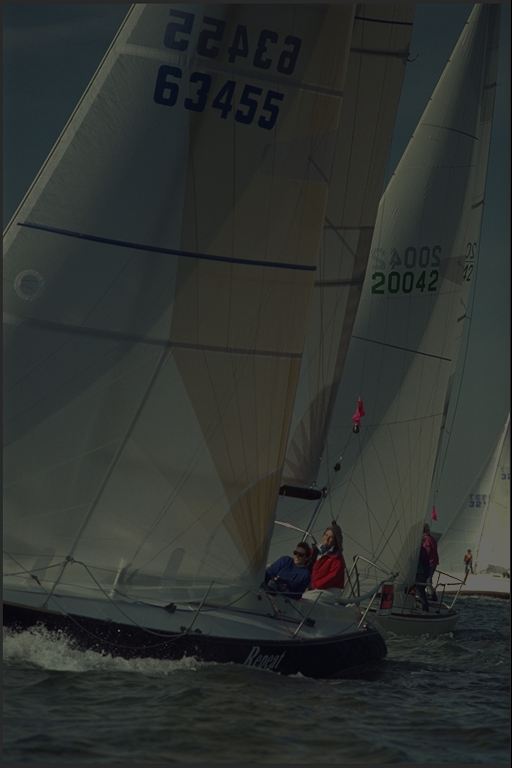

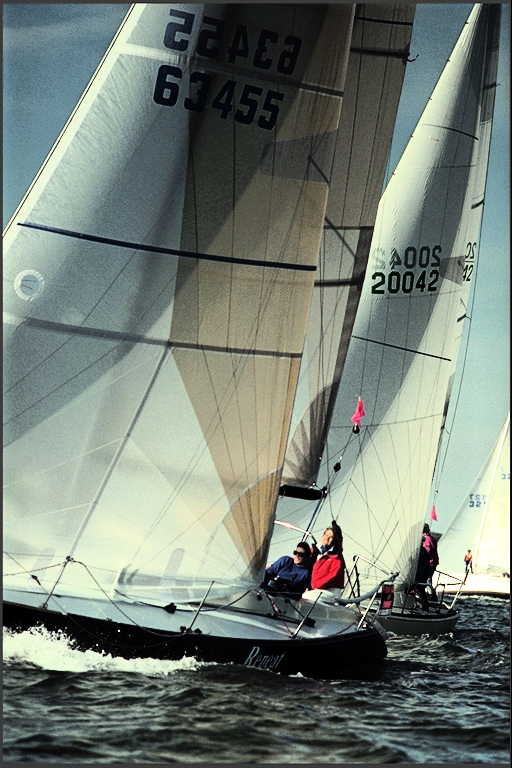

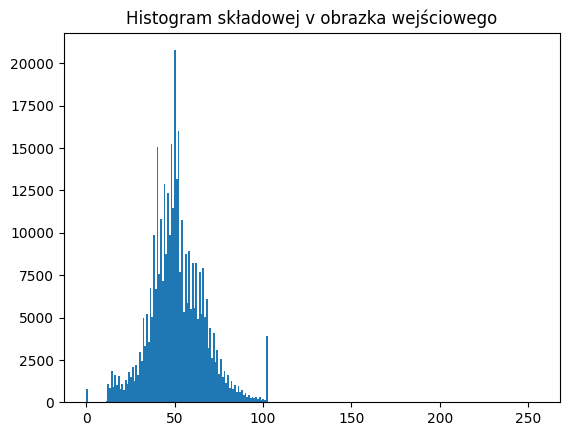

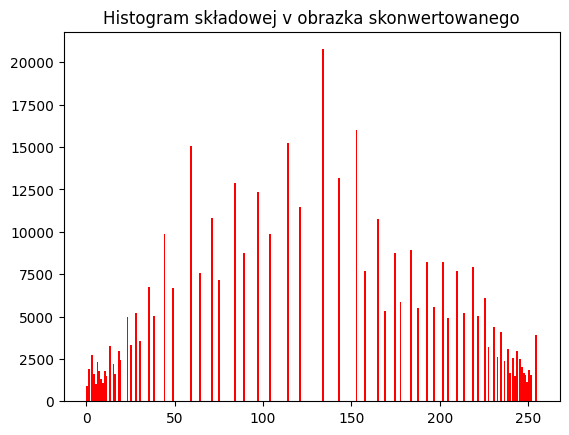

In [165]:
#Zadanie 2 

colimage = cv2.imread(data_dir+"sailboat_col_lowc.png", cv2.IMREAD_UNCHANGED)

#konwersja do przestrzeni HSV
col_hsv = cv2.cvtColor(colimage, cv2.COLOR_BGR2HSV)

#b) metoda wyrównania histogramu

#wyodrębnienie składowej v przed wyrównaniem
h, s, v = cv2.split(col_hsv)

#wyznaczenie wartości składowej stałej przed konwersją
value_v = col_hsv.mean()

#wyrównanie histogramu
col_hsv[:,:,2] = cv2.equalizeHist(col_hsv[:,:,2])


#wyznaczenie wartości składowej stałej po wyrównaniu histogramu
value_v1 = col_hsv.mean()

#wyodrębnienie składowej v po wyrównaniu
h1,s1,v1 = cv2.split(col_hsv)

#konwersja do przestrzeni RGB po wyrównaniu histogramu
obrazWynikowy = cv2.cvtColor(col_hsv, cv2.COLOR_HSV2BGR)

#odczytana wartość składowej stałej przed i po konwersji
print("Wartość składowej stałej v przed konwersją jest równa {}".format(value_v))
print("Wartość składowej stałej v po skonwertowaniu jest równa {}".format(value_v1))

#wyświetlenie obrazka wejściowego i skonwertowanego
imshow(colimage,"Obrazek wejściowy")
imshow(obrazWynikowy,"Obrazek skonwertowany")


#wyświetlenie histogramu obrazka wejściowego
plt.figure()
plt.title("Histogram składowej v obrazka wejściowego")
hist_plt = plt.hist(v.flatten(), 256, range=[0.0, 255.0])

#wyświetlenie histogramu obrazka skonwertowanego
plt.figure()
plt.title("Histogram składowej v obrazka skonwertowanego")
hist_plt1 = plt.hist(v1.flatten(), 256, range=[0.0, 255.0],color="red")



In [182]:
#Zadanie 2 

#a) metoda rozciągnięcia histogramu
colimage = cv2.imread(data_dir+"sailboat_col_lowc.png", cv2.IMREAD_UNCHANGED)

#konwersja do przestrzeni HSV
col_hsv = cv2.cvtColor(colimage, cv2.COLOR_BGR2HSV)



#wyodrębnienie składowej v przed rozciągnięciem
h, s, v = cv2.split(col_hsv)

#wyznaczenie wartości składowej stałej przed konwersją
value_v = col_hsv.mean()

#rozciągnięcie histogramu
hist= cv2.calcHist([v], [0], None, [256], [0, 256])
c = cv2.normalize(hist,hist, 0, 255, cv2.NORM_MINMAX)


plt.figure()
hist_plt = plt.hist(v.flatten(), 256, range=[0.0, 255.0])

plt.figure()
hist_plt1 = plt.hist(hist.flatten(), 256, range=[0.0, 255.0],color="green")


Porównać obrazy i histogramy. Czy operacje dają podobne wyniki? Jaki jest ich wpływ na kształt histogramu? Która z operacji dała dla testowanego obrazu subiektywnie ładniejszy wynik?

Porównanie obrazów i histogramów.
Po wyrównaniu histogramu z obrazu wejściowego zniknął efekt "ciemności", dzięki czemu obserwator jest w stanie zauważyć więcej szczegółów na obrazku.

Czy operacje dają podobne wyniki?
Przed wyrównaniem wynosiła ona ok. 52.85, zaś po wyrównaniu 79.21 

Jaki jest ich wpływ na kształt histogramu?
W wyniku rozciągnięcia histogramu, dokonano przeskalowania wartości pikseli do pełnego przedziału wartości. W związku z czym wartość składowej stałej v uległa zmianie. 

Która z operacji dała dla testowanego obrazu subiektywnie ładniejszy wynik?
......

Wyostrzenie obrazu dla W=0, wymiary: (768, 512, 3), typ danych: uint8, wartości: 0 - 255


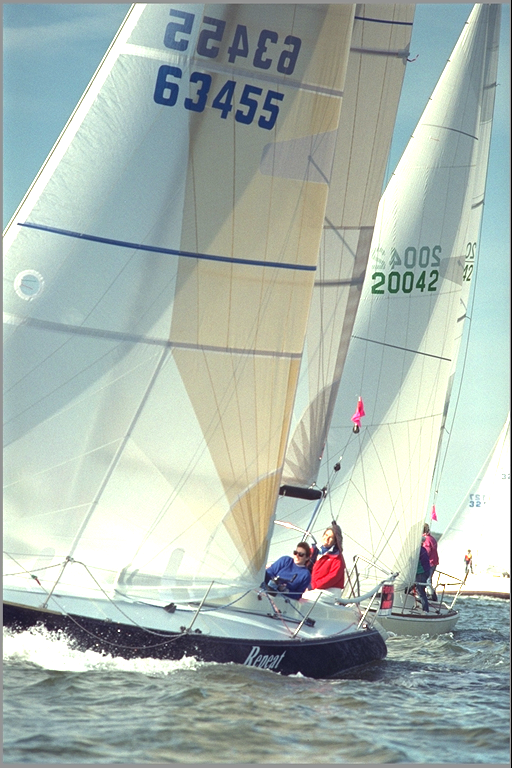

Wyostrzenie obrazu dla W=-0.5, wymiary: (768, 512, 3), typ danych: uint8, wartości: 0 - 255


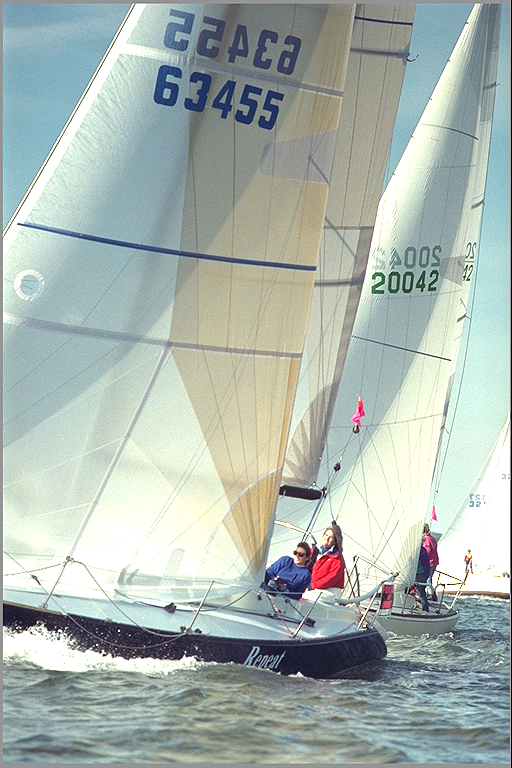

Wyostrzenie obrazu dla W=-1, wymiary: (768, 512, 3), typ danych: uint8, wartości: 0 - 255


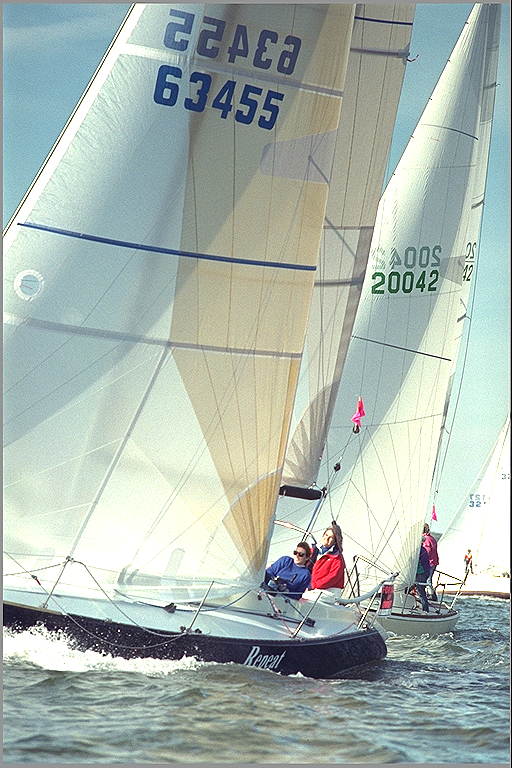

Wyostrzenie obrazu dla W=-1.5, wymiary: (768, 512, 3), typ danych: uint8, wartości: 0 - 255


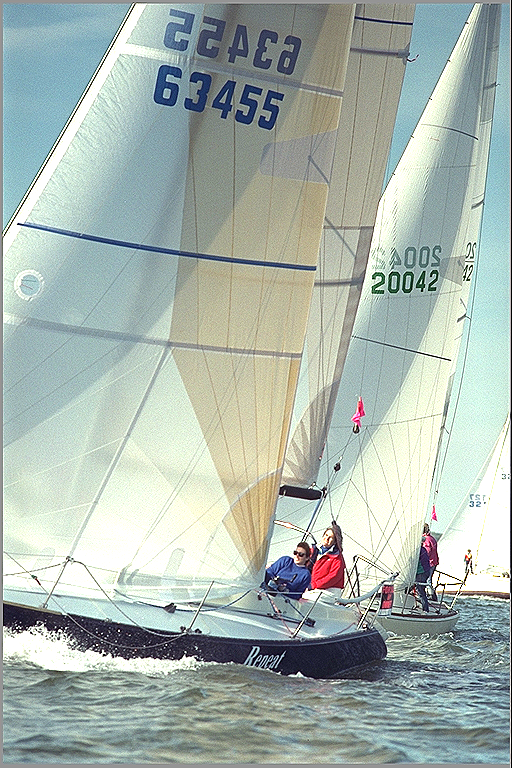

Wyostrzenie obrazu dla W=-2, wymiary: (768, 512, 3), typ danych: uint8, wartości: 0 - 255


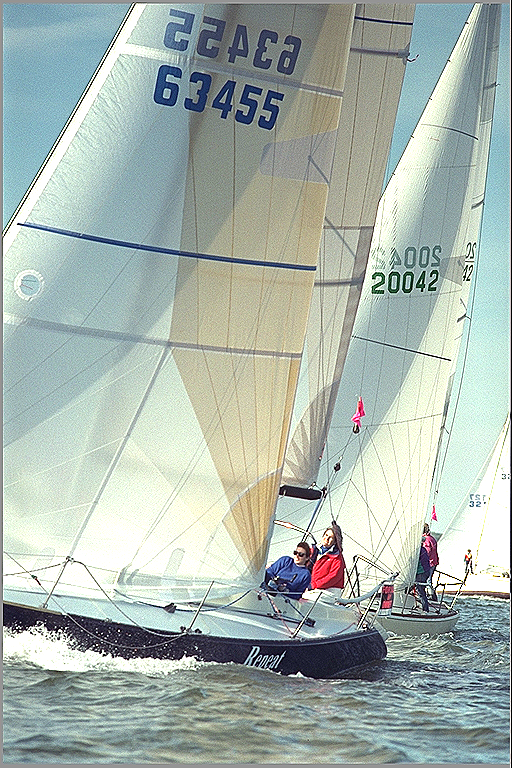

Wyostrzenie obrazu dla W=-3, wymiary: (768, 512, 3), typ danych: uint8, wartości: 0 - 255


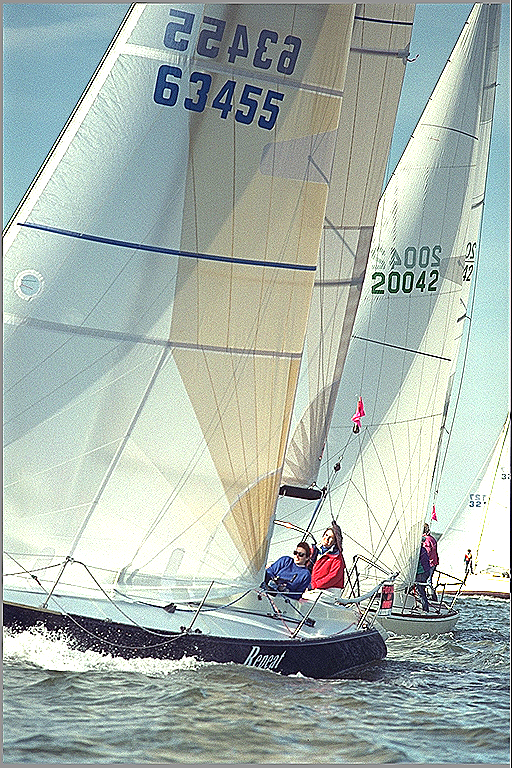

Wyostrzenie obrazu dla W=-5, wymiary: (768, 512, 3), typ danych: uint8, wartości: 0 - 255


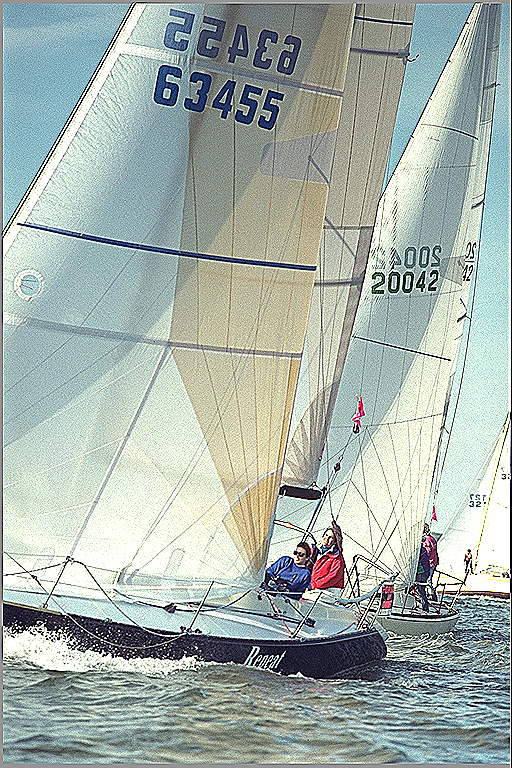

Wyostrzenie obrazu dla W=-10, wymiary: (768, 512, 3), typ danych: uint8, wartości: 0 - 255


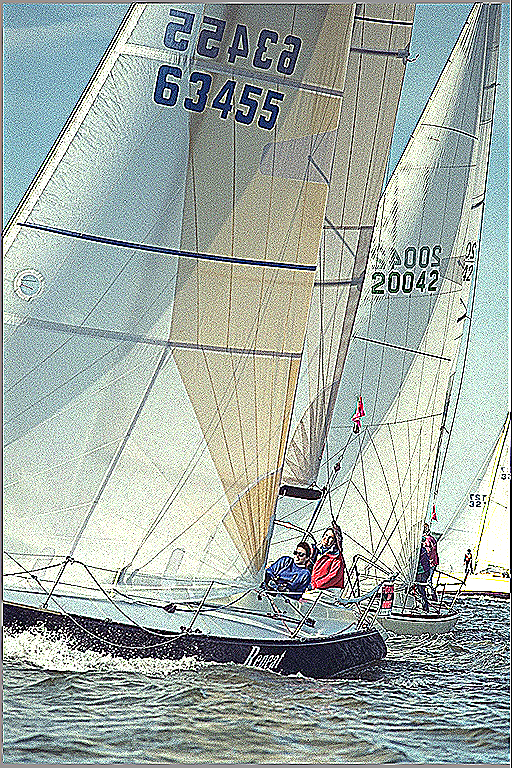

Wyostrzenie obrazu dla W=-20, wymiary: (768, 512, 3), typ danych: uint8, wartości: 0 - 255


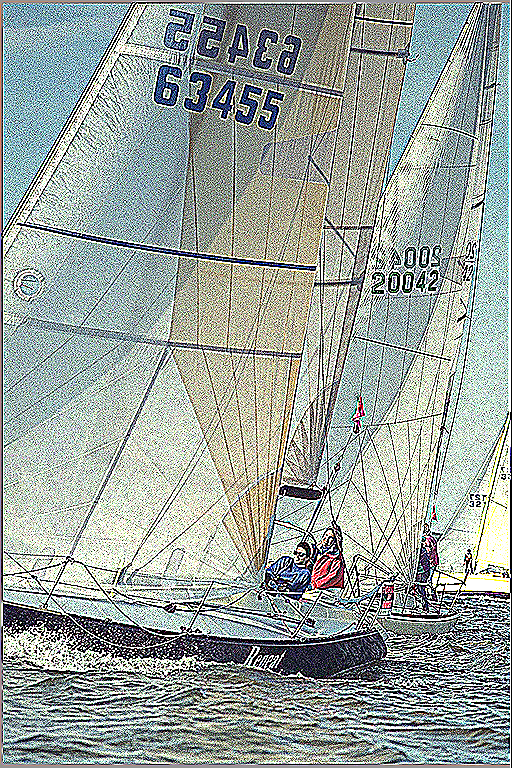

In [209]:
#Zadanie 3 Wyostrzenie obrazu
img_zad3 = cv2.imread(data_dir+"sailboat_col.png", cv2.IMREAD_UNCHANGED)


def wyostrzenie_Obrazu(W):
  img_laplace = cv2.Laplacian(img_zad3, cv2.CV_64F)
  img_out = img_zad3 + W*img_laplace 
  sharp_img = cv2.addWeighted(img_zad3, 1, img_out, 0.5, 0, dtype=cv2.CV_8U)
  printi(sharp_img, "Wyostrzenie obrazu dla W={}".format(W)) 
  imshow(sharp_img, "Wyostrzenie obrazu dla W={}".format(W))


wyostrzenie_Obrazu(0)
wyostrzenie_Obrazu(-0.5)
wyostrzenie_Obrazu(-1)
wyostrzenie_Obrazu(-1.5)
wyostrzenie_Obrazu(-2)
wyostrzenie_Obrazu(-3)
wyostrzenie_Obrazu(-5)
wyostrzenie_Obrazu(-10)
wyostrzenie_Obrazu(-20)

Dla jakich wartości wagi W uzyskuje się dobre, przyjemne dla oka wyniki (poprawę subiektywnej
jakości obrazu)? A dla jakich wartości W wyniki są jeszcze niezauważalne, albo już nieprzyjemne?

Przyjemne dla oka wyniki są uzyskiwane dla wartości wagi W z przedziału [0:-2] .
Dla wartości wagi W z przedziału [-2:10] dla coraz mniejszego W, wyniki stają się mniej przyjemne dla oka odbiorcy.
Dla wartości wagi W mniejszych od -10 wyniki stają się już nieprzyjemne. Wynikowy obraz wygląda na niespójny i szorstki. Obraz początkowy wyglądał na "gładki", zaś obraz z wagą W<-10 wygląda jakby miał strukturę "ziarnistą". 